#**How to Train YOLO11 Object Detection Model on a Custom Dataset**

In [ ]:
!nvidia-smi

Tue Sep  2 05:50:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   61C    P8             13W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**Step 01 # Install the Ultralytics Package**

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.3 MB/s eta 0:00:00


**Step 02 # Import All the Requried Libraries**

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.0/112.6 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import Image

**Step # 03 Download Dataset from Roboflow**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="PzcvrZ6AoWLRe95J11KK")
project = rf.workspace("li-famhf").project("people-8natc")
version = project.version(3)
dataset = version.download("yolov11")




loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to people-3 in yolov11:: 100%|██████████| 2100/2100 [00:00<00:00, 7240.30it/s]


In [ ]:
dataset.location

'/content/people-3'

**Step # 04 Train YOLO11 Model on a Custom Dataset**

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11m.pt" epochs=40 imgsz=640

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/people-3/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained

**Step # 05 Examine Training Results**

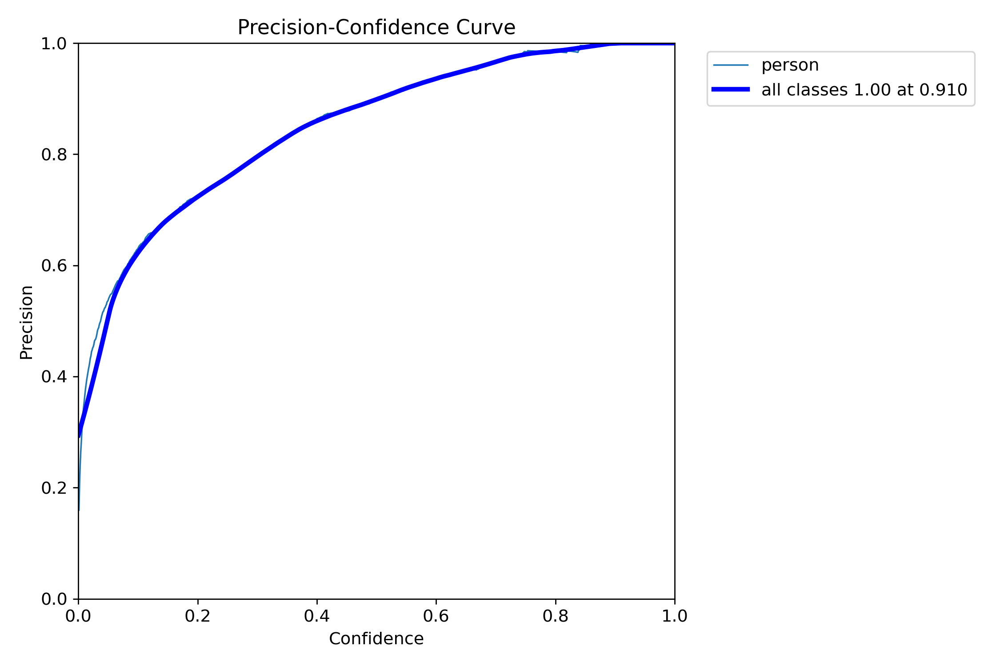

In [ ]:
from IPython.display import Image
Image("/content/runs/detect/train3/BoxP_curve.png", width=600)

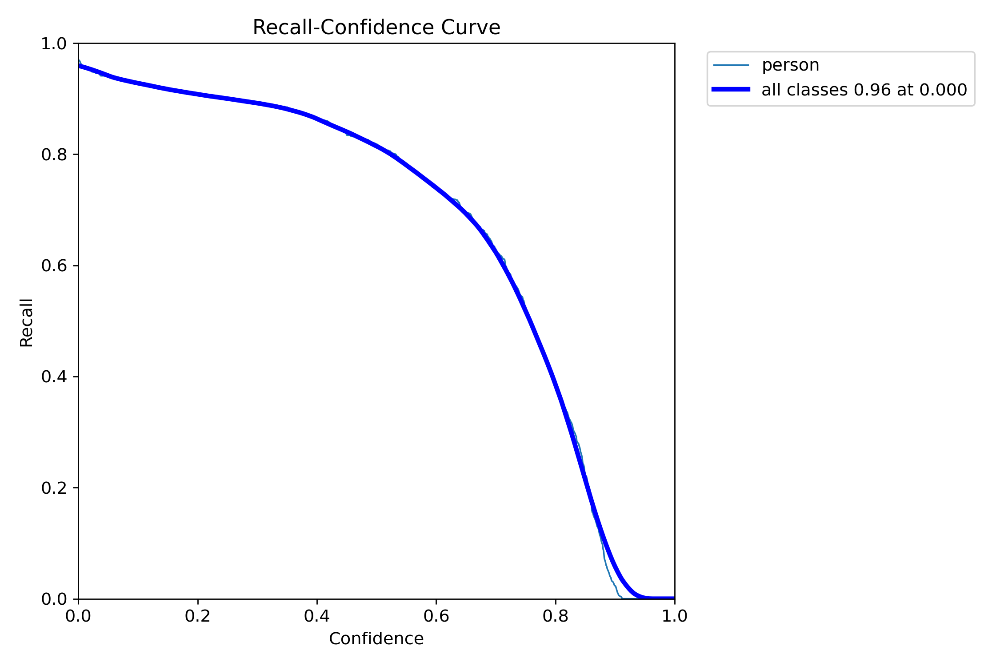

In [ ]:
Image("/content/runs/detect/train3/BoxR_curve.png", width=600)

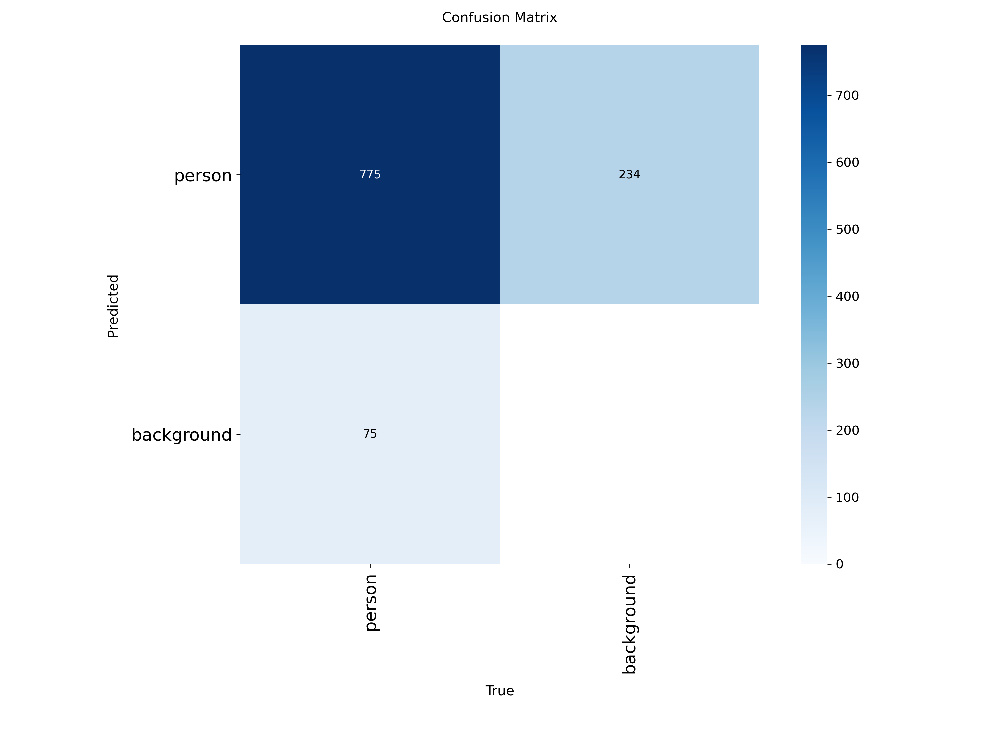

In [ ]:
Image("/content/runs/detect/train3/confusion_matrix.png", width=600)

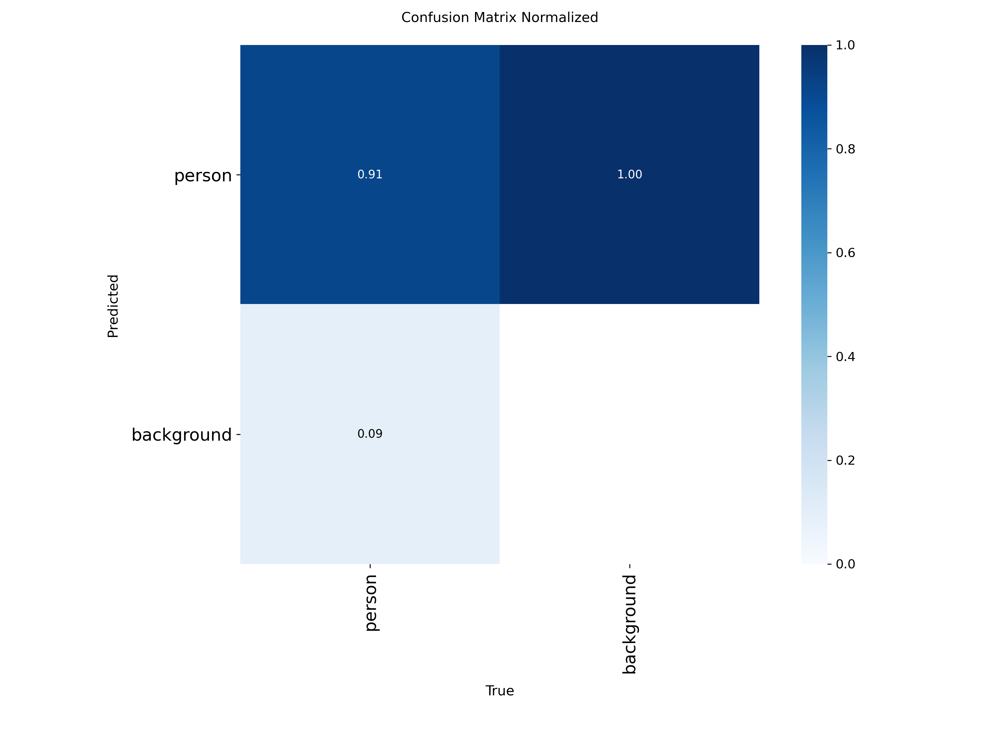

In [ ]:
Image("/content/runs/detect/train3/confusion_matrix_normalized.png", width=600)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

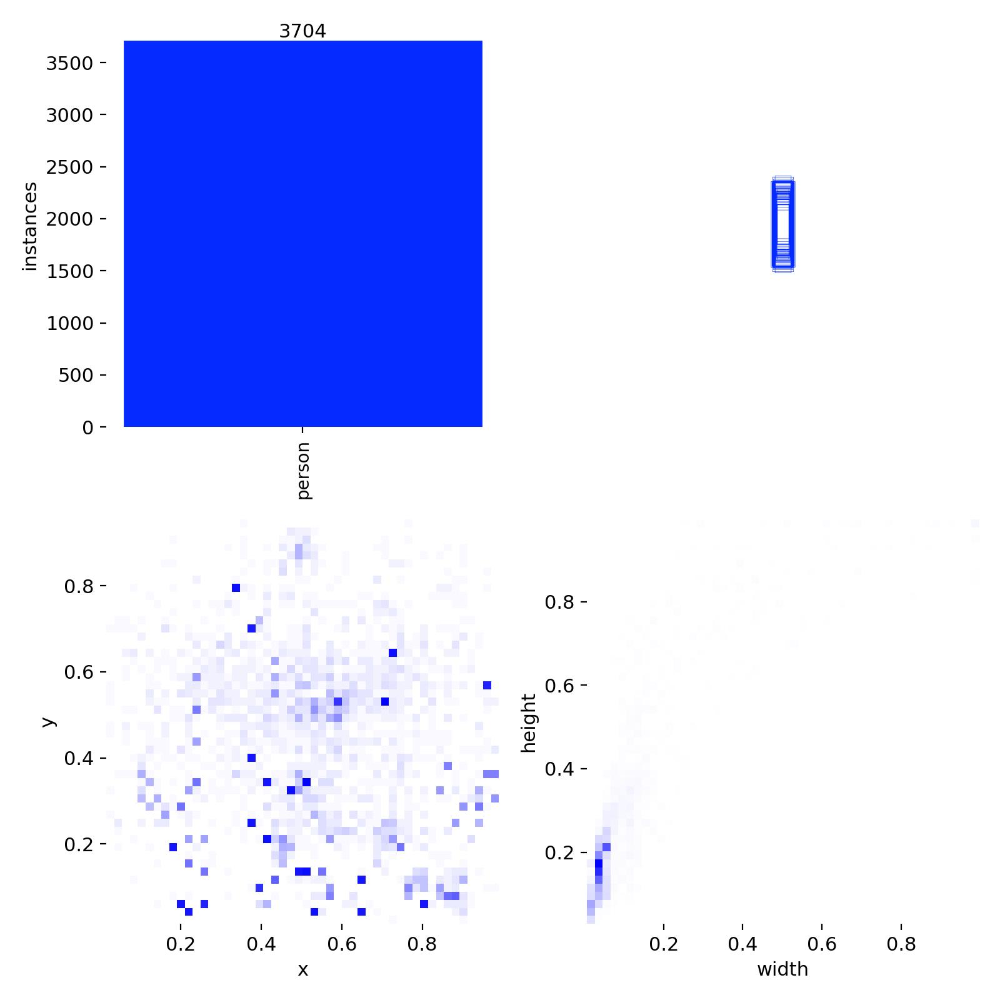

In [ ]:
Image("/content/runs/detect/train3/labels.jpg", width=600)

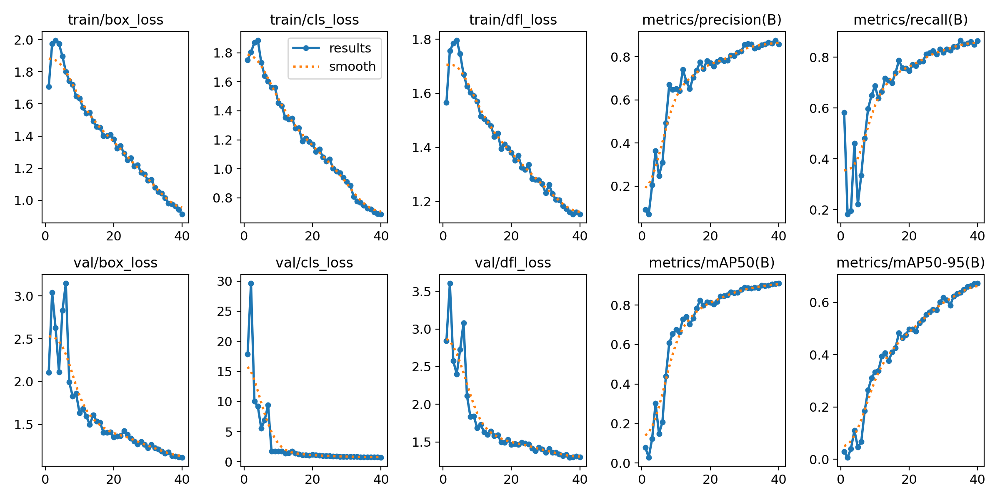

In [ ]:
Image("/content/runs/detect/train3/results.png", width=600)

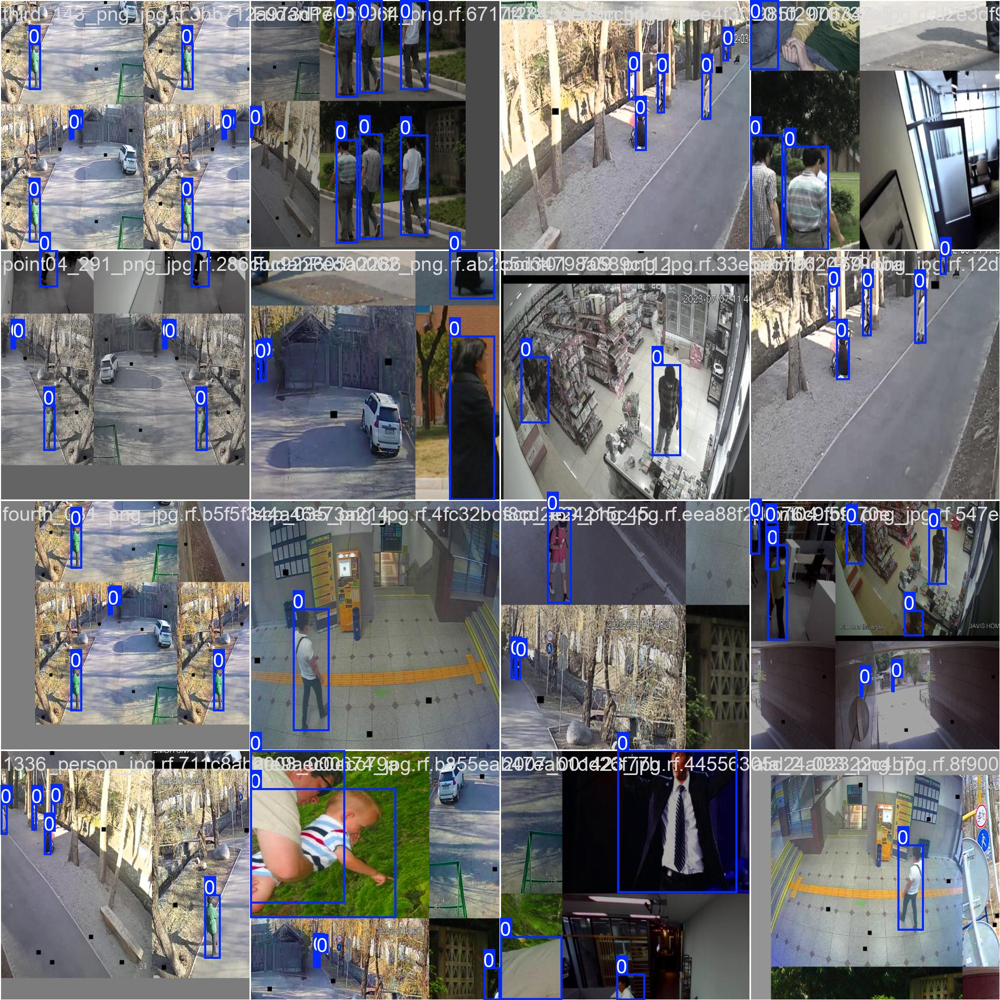

In [ ]:
Image("/content/runs/detect/train3/train_batch0.jpg", width=600)

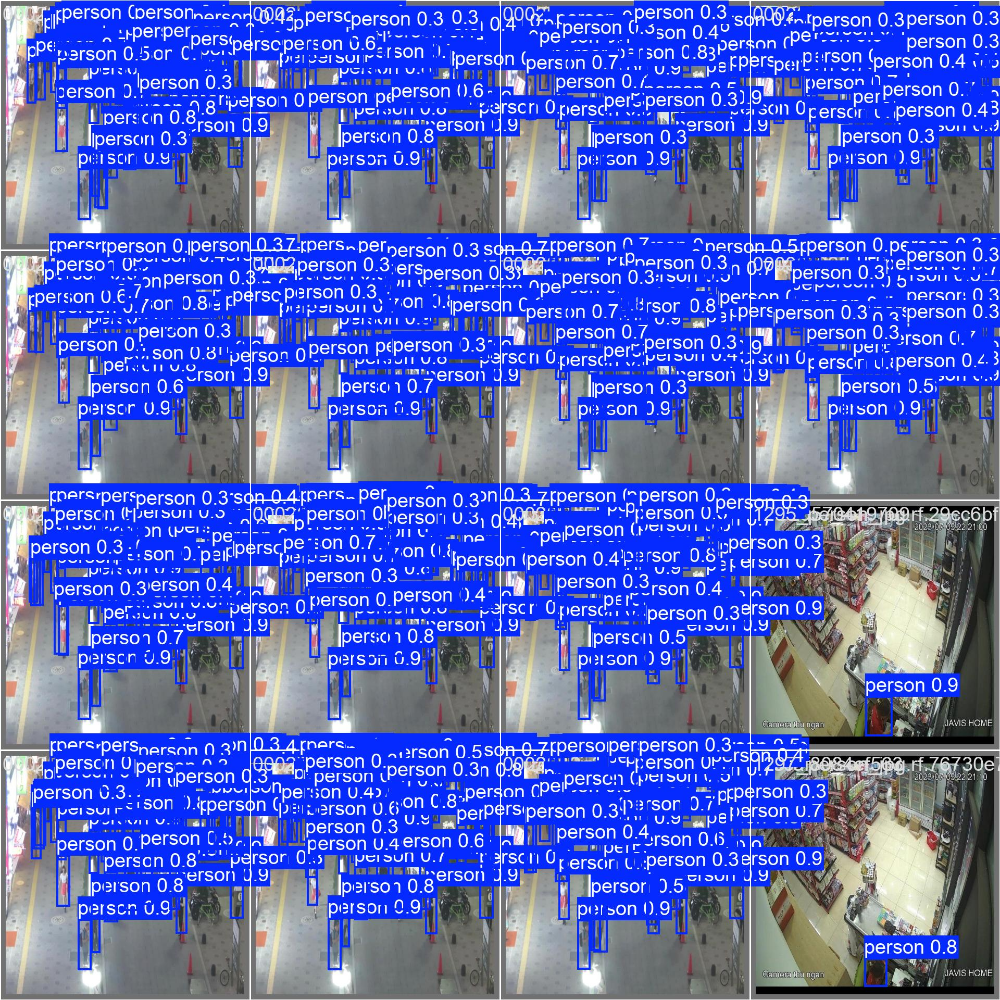

In [ ]:
Image("/content/runs/detect/train3/val_batch0_pred.jpg", width=600)

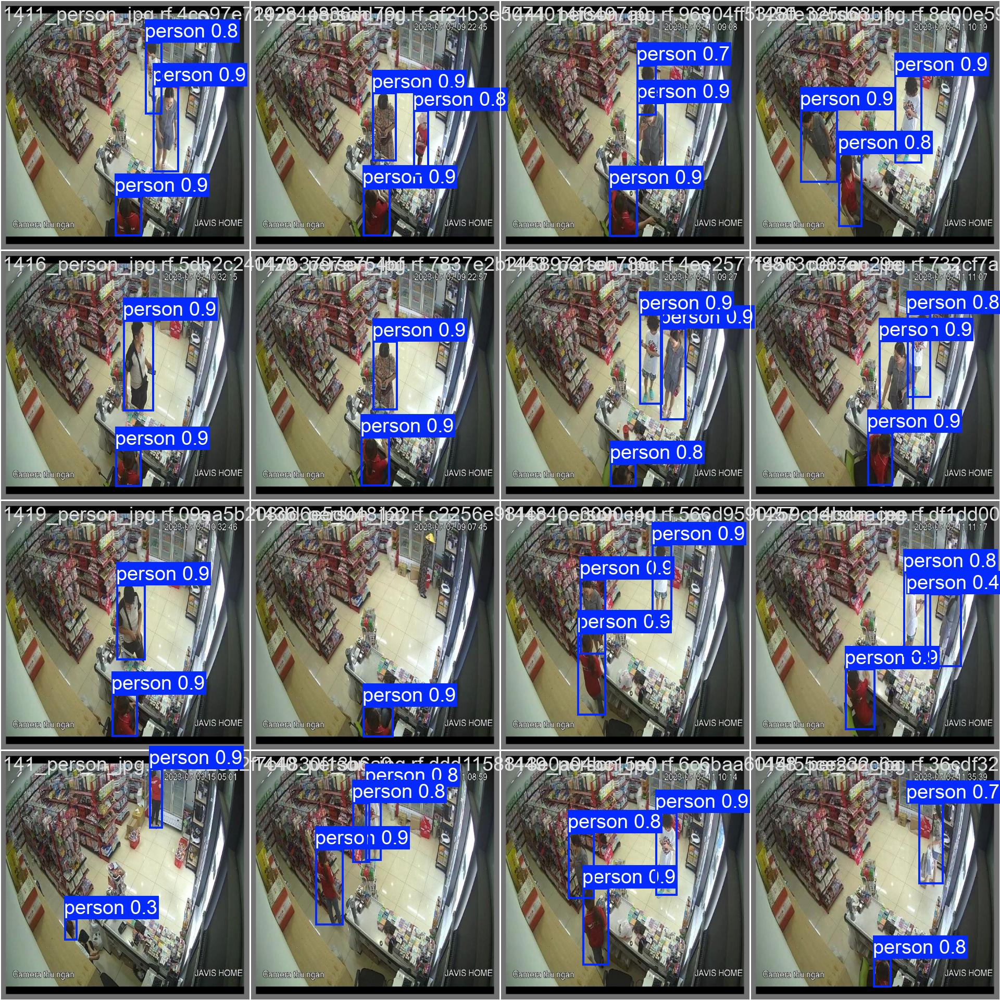

In [ ]:
Image("/content/runs/detect/train3/val_batch1_pred.jpg", width=600)

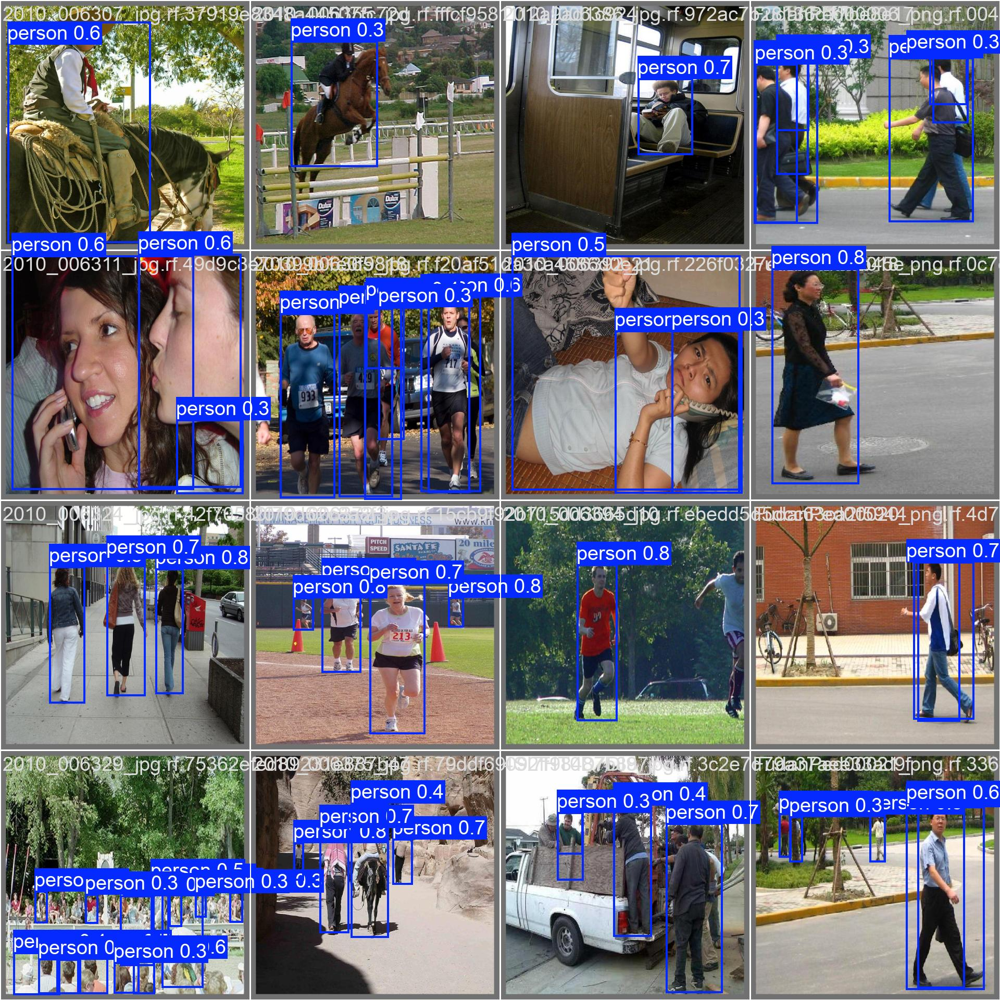

In [ ]:
Image("/content/runs/detect/train3/val_batch2_pred.jpg", width=600)

In [ ]:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mv /content/runs/detect/train3/weights/best.pt /content/drive/MyDrive/YOLO11_Custom_Training/results

**Step # 06 Download the Model Weights from the Google Drive**

In [ ]:
!gdown "https://drive.google.com/uc?id=1lqJOQGduRipfLFpu9vvIqlpr5csN485N&confirm=t"



Downloading...
From: https://drive.google.com/uc?id=1lqJOQGduRipfLFpu9vvIqlpr5csN485N&confirm=t
To: /content/best.pt
100% 40.5M/40.5M [00:00<00:00, 177MB/s]


**Step # 07  Validate Fine-Tuned Model**

In [ ]:
!yolo task=detect mode=val model="best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1807.9±616.0 MB/s, size: 70.9 KB)
val: Scanning /content/people-3/valid/labels.cache... 123 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 123/123 1917841.6it/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.4it/s 5.7s
                   all        123        850      0.859      0.866       0.91      0.673
Speed: 1.0ms preprocess, 26.7ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


**Step # 08 Inference with Custom Model on Images**

In [ ]:
!yolo task=detect mode=predict model= best.pt conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs

image 1/38 /content/people-3/test/images/000232_jpg.rf.ef2b727452f00c2d3800c03877f71ed2.jpg: 640x640 123 persons, 56.6ms
image 2/38 /content/people-3/test/images/1310_person_jpg.rf.efda762f4e55ebfa3e5f7239ceebdd9f.jpg: 640x640 1 person, 36.9ms
image 3/38 /content/people-3/test/images/1322_person_jpg.rf.15067f2fe20e08cd409d7f833430da75.jpg: 640x640 1 person, 36.8ms
image 4/38 /content/people-3/test/images/1334_person_jpg.rf.0a056de59ce73323fd0cf419fed86047.jpg: 640x640 1 person, 36.8ms
image 5/38 /content/people-3/test/images/1376_person_jpg.rf.a93f07b9d4e8875d1de49b1929835544.jpg: 640x640 2 persons, 28.9ms
image 6/38 /content/people-3/test/images/1399_person_jpg.rf.ba6c2d612c32d07c6c9ca23b7064dee5.jpg: 640x640 2 persons, 27.7ms
image 7/38 /content/people-3/test/images/1401_person_jpg.rf.9d640ecff9415e04192e0b5c4919ecd9.

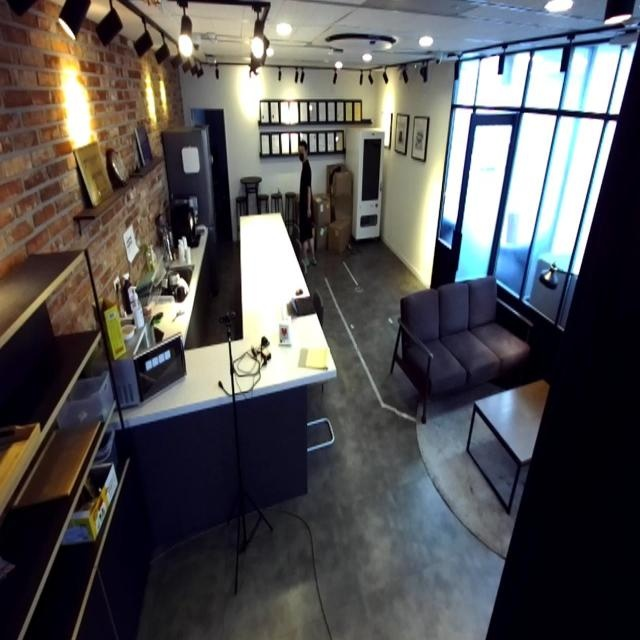

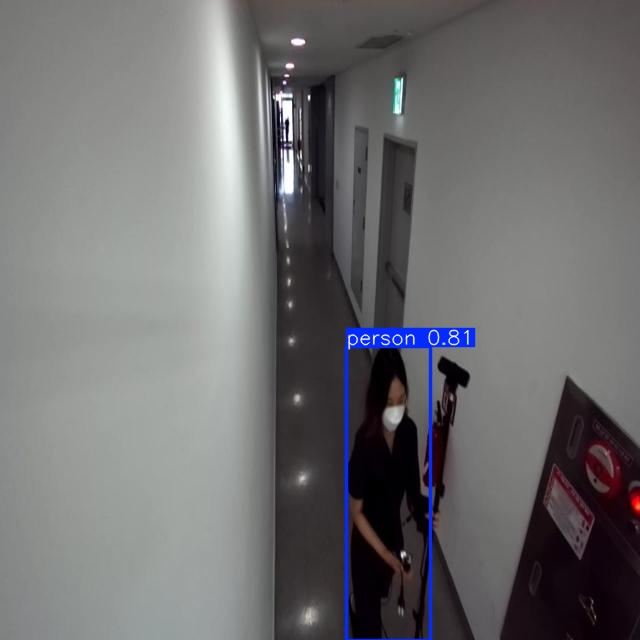

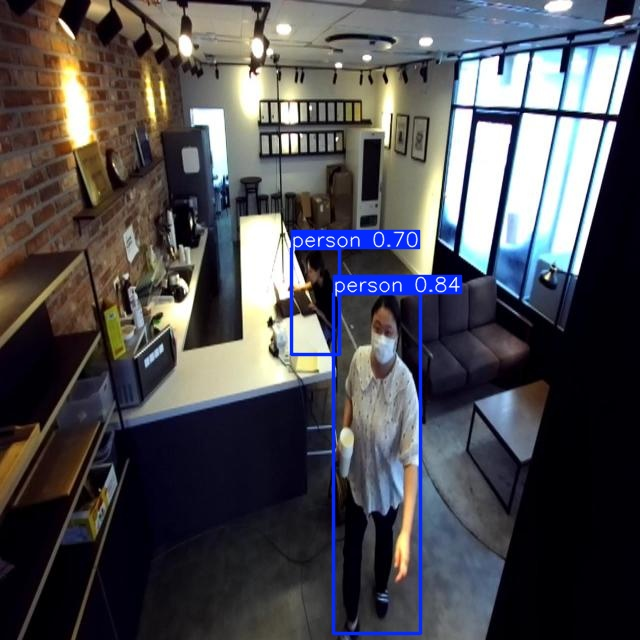

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [ ]:
!gdown"https://drive.google.com/uc?id=10tLBtUA9g2QDvr7MmQLzykMsjnd9iq3m&confirm=t"


/bin/bash: line 1: gdownhttps://drive.google.com/uc?id=10tLBtUA9g2QDvr7MmQLzykMsjnd9iq3m&confirm=t: No such file or directory


In [ ]:
!yolo task=detect mode=predict model= best.pt conf=0.25 source=image2.jpg save=True

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs

image 1/1 /content/image2.jpg: 640x640 5 persons, 57.1ms
Speed: 4.1ms preprocess, 57.1ms inference, 153.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


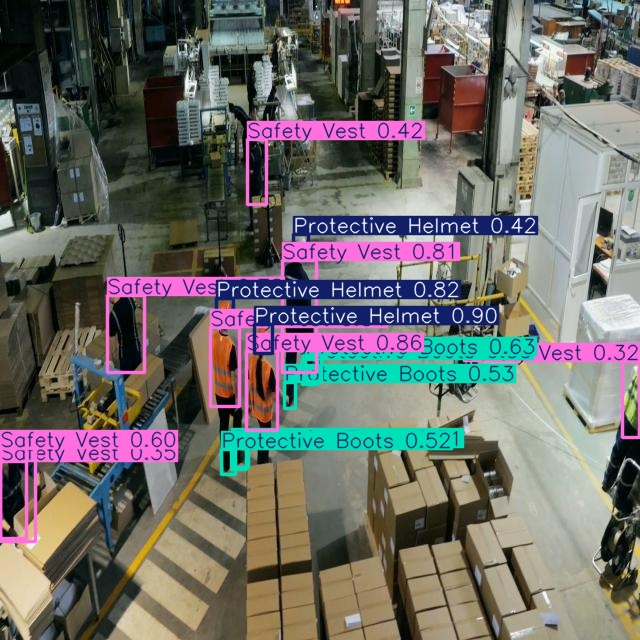

In [ ]:
Image("/content/runs/detect/predict2/image2.jpg", width=600)

**Step # 08 Inference with Custom Model on Videos**

In [ ]:
!gdown "https://drive.google.com/uc?id=1B9vPurH0A0xX0Wg_Lm1L8jLULoq3ejEl&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1B9vPurH0A0xX0Wg_Lm1L8jLULoq3ejEl&confirm=t
To: /content/DJI_20250117152243_0001_V_Edited.mov
100% 66.8M/66.8M [00:00<00:00, 106MB/s] 


In [ ]:
!gdown "https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1SxcrDanPAr-PZfJjWBxoa2t8lUSM2dZn&confirm=t
To: /content/PPE_Part2.mp4
100% 11.1M/11.1M [00:00<00:00, 20.9MB/s]


In [ ]:
!yolo task=detect mode=predict model= best.pt conf=0.25 source="DJI_20250117152243_0001_V_Edited.mov" save=True

Ultralytics 8.3.191 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs

video 1/1 (frame 1/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 109.0ms
video 1/1 (frame 2/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 24.0ms
video 1/1 (frame 3/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 24.0ms
video 1/1 (frame 4/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 24.0ms
video 1/1 (frame 5/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 24.0ms
video 1/1 (frame 6/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 24.0ms
video 1/1 (frame 7/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 24.0ms
video 1/1 (frame 8/1982) /content/DJI_20250117152243_0001_V_Edited.mov: 384x640 (no detections), 24.0m

In [ ]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict4/DJI_20250117152243_0001_V_Edited.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Output hidden; open in https://colab.research.google.com to view.

Don"t worry about this

In [ ]:
!yolo task=detect mode=predict model=best.pt conf=0.25 source="PPE_Part2.mp4" save=True

Ultralytics 8.3.1 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/267) /content/PPE_Part2.mp4: 384x640 (no detections), 45.5ms
video 1/1 (frame 2/267) /content/PPE_Part2.mp4: 384x640 (no detections), 8.7ms
video 1/1 (frame 3/267) /content/PPE_Part2.mp4: 384x640 (no detections), 11.6ms
video 1/1 (frame 4/267) /content/PPE_Part2.mp4: 384x640 (no detections), 12.6ms
video 1/1 (frame 5/267) /content/PPE_Part2.mp4: 384x640 1 Protective Helmet, 1 Safety Vest, 13.3ms
video 1/1 (frame 6/267) /content/PPE_Part2.mp4: 384x640 (no detections), 12.2ms
video 1/1 (frame 7/267) /content/PPE_Part2.mp4: 384x640 (no detections), 11.7ms
video 1/1 (frame 8/267) /content/PPE_Part2.mp4: 384x640 (no detections), 8.6ms
video 1/1 (frame 9/267) /content/PPE_Part2.mp4: 384x640 (no detections), 11.8ms
video 1/1 (frame 10/267) /content/PPE_Part2.mp4: 384x640 (no detections), 12.0ms
video 1/1 (frame 

In [ ]:
!rm '/content/result_compressed.mp4'

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict4/PPE_Part2.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
import os

# Check the contents of the training results directory
!ls /content/runs/detect/train3

args.yaml			 results.csv	      val_batch0_labels.jpg
BoxF1_curve.png			 results.png	      val_batch0_pred.jpg
BoxP_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
BoxPR_curve.png			 train_batch1.jpg     val_batch1_pred.jpg
BoxR_curve.png			 train_batch2.jpg     val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch3920.jpg  val_batch2_pred.jpg
confusion_matrix.png		 train_batch3921.jpg  weights
labels.jpg			 train_batch3922.jpg
